In [8]:
import numpy as np
import pandas as pd
import matplotlib as plt
import seaborn as sns


In [2]:
import plotly.express as px

In [9]:
#Import appropriate files
X_train = pd.read_csv('../data/well_features.csv')
y_train = pd.read_csv('../data/well_labels.csv')
X_test = pd.read_csv('../data/well_test_labels.csv')

In [6]:
#Merge the files the begin exploratory data analysis
X_train = X_train.set_index(X_train['id'])
y_train = y_train.set_index(y_train['id'])

df_train = X_train.copy()
df_train = df_train.merge(y_train, how='outer')

In [12]:
df_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [197]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  int64  
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [ ]:
#changed date recorded as years with int
X_train['date_recorded'] = X_train['date_recorded'].map(lambda x: x[:4]).astype('int64')

Started Exploring the relationship with well counts across various column features. We used plotly to help visualize these graphs and seaborn to make the plots for our presentations.

In [188]:
fig_hist = px.histogram(df_train, x = "region", color = "status_group", labels={"status_group": "Status Group"})
fig_hist.show()

In [63]:
fig_hist = px.histogram(df_train, x = "region", y = "population")
fig_hist.show()

In [190]:
fig_hist_quantity = px.histogram(df_train, x = "quantity", color = "status_group", )
fig_hist_quantity.show()

In [72]:
fig_hist_installer = px.histogram(df_train, x = "management", color = "status_group")
fig_hist_installer.show()

In [172]:
fig_hist_extraction_type = px.histogram(df_train, x = "construction_year", color = "status_group",)
fig_hist_extraction_type.show()

Can't see much with construction year due to the records added as Zero. Just going to drop it for EDA purposes.

In [179]:
df_train1 = df_train[df_train["construction_year"] != 0]

In [196]:
df_train1['construction_year'].min()

1960

In [189]:
fig_hist_extraction_type = px.histogram(df_train1, x = "construction_year", color = "status_group", labels={"status_group": "Status Group"})
fig_hist_extraction_type.show()

In [58]:
fig_hist_altitutde = px.histogram(df_train, x = "gps_height", color = "status_group")
fig_hist_altitutde.show()

Let's see how longitude and latitude looks when plotted.

In [258]:
fig = px.scatter_mapbox(df_train, lat="latitude", lon="longitude", color="status_group",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=25, zoom=5, height=800,
                  mapbox_style="carto-positron")
fig.show()

### FROM HERE: These are plots maded for our presentations specifically for our formal presentation.

In [ ]:
dropped_list=['id','funder','wpt_name','num_private','basin','subvillage','region_code','district_code','lga','ward','recorded_by','scheme_name','extraction_type_group','extraction_type_class','management_group','payment_type','quality_group','quantity_group','source_type','source_class','waterpoint_type_group']
X_train = X_train.set_index(X_train['id'])
y_train = y_train.set_index(y_train['id'])
X_test = X_test.set_index(X_test['id'])
X_train = X_train.drop(dropped_list,axis=1)
X_test = X_test.drop(dropped_list,axis=1)
y_train = y_train.drop('id',axis=1)

In [75]:
#Skylar Chart, Plotted to see the differences and ajusted the word length from here. Code is super messy and is fixed below in version 2

x = [0.7433, 0.7782, 0.722, 0.7783, 0.8021, 0.8026, 0.8028, 0.7863, 0.7826, 0.7211, 0.7866, 0.7907, 0.7909, 0.7888, 0.7904, 0.7981, 0.821]
x_label1 = ['Decision Tree, max_depth = 10','K Nearest Neighbors, n_neighbors = 6', 'random forest, depth 10', 'random forest, depth 20', 'Bagging, n_estimators = 100',
    'Bagging, n_estimators = 200','Bagging, n_estimators = 500','Bagging Smote, n_estimators = 300', 'Bagging Smote, n_estimator = 1000', 
    'HistGradientBoosting, learning_rate = 1/max_iter = 100/max_depth =10/L2_regularization = 0',
    'HistGradientBoosting, learning_rate adjuisted to .1' , 'HistGradientBoosting, max_depth adjusted to 15', 'HistGradientBoosting, max_depth adjusted to 20', 
    'HistGradientBoosting, L2_regularization adjusted to 2', 'HistGradientBoosting, max_depth adjusted to 25', 'HistGradientBoosting, max_iter adjusted to 200', 
    'GradientBoosting, learning_rate = .1/max_depth = 20'] 

x_label2 = ['Decision Tree','K Nearest Neighbors', 'Random Forest', 'Random Forest - Tuned Depth', 'Bagging',
    'Bagging 200','Bagging 500','Bagging SMOTE 300', 'Bagging SMOTE 1000', 
    'HistGradientBoosting',
    'HistGradientBoosting,LR 0.1' , 'HistGradientBoosting, Depth 15', 'HistGradientBoosting - Depth 20', 
    'HistGradientBoosting - Reg 2', 'HistGradientBoosting - Depth 25', 'HistGradientBoosting - Iter 200', 
    'GradientBoosting'] 


In [205]:
#Cleaned up version of the variables above
x_updated = [0.7433, 0.7782, 0.722, 0.7783, 0.7211, 0.7866, 0.7907, 0.7909, 0.7888, 0.7981, 0.8021, 0.8021, 0.8026, 0.8028, 0.7863, 0.7826]

x_label2_updated = ['Decision Tree','KNN', 'RForest', 'RF Depth20','HGC',
    'HGC LR 0.1' , 'HBC Depth 15', 'HGC Depth 20', 
    'HGC L2Reg 2', 'HGC Iter 200', 
    'GradientBoosting', 'Bagging',
    'Bagging 200','Bagging 500','BagSMOTE 300', 'BagSMOTE 1000'] 

C:\Users\01aut\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



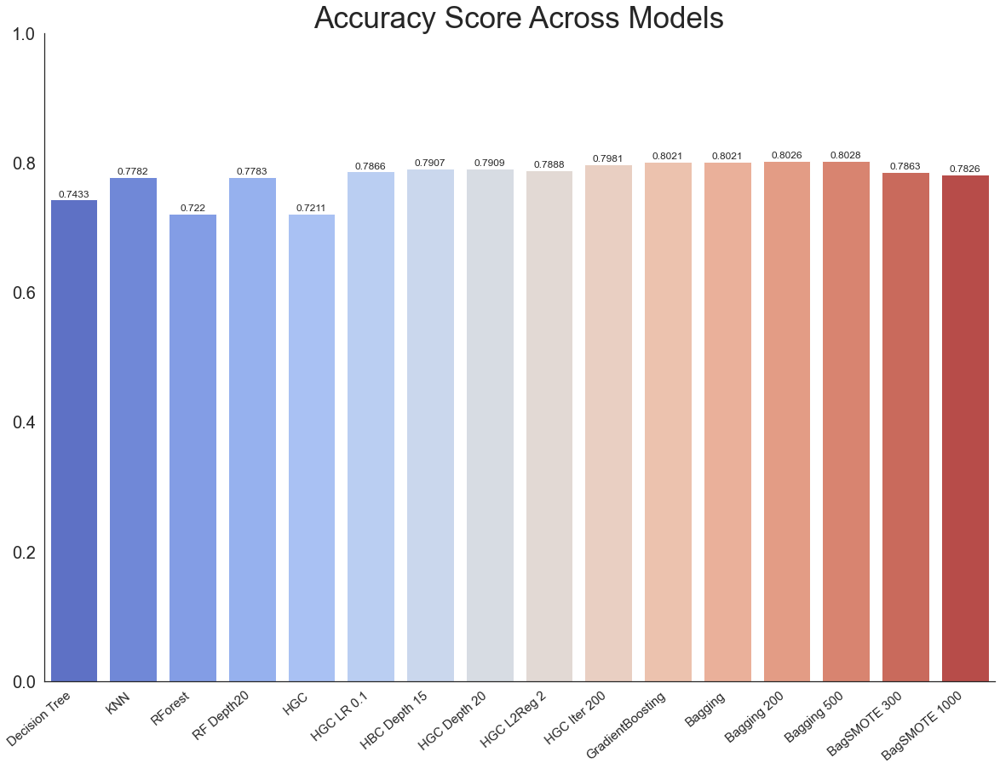

In [206]:
sns.set(style='white')
fig, ax = plt.subplots(figsize=(20, 14))
x_label = x_label2_updated

ax = sns.barplot(x_label, x_updated, palette="coolwarm")
ax.set(ylim=(0, 1))
plt.xticks(rotation=40, size=15, horizontalalignment='right')
plt.yticks(size=20)
sns.despine()

ax.bar_label(ax.containers[0], padding = 1)

ax.set_title('Accuracy Score Across Models', fontsize=35)
# ax.set_xlabel('Model Number', fontsize=35)

plt.savefig('Skylar_model', bbox_inches='tight');

We Had our accuracy score on another Jupyter Notebook. Pulled the CSV file of it to graph here.

In [170]:
df_comp = pd.read_csv('../data/competition.csv')

In [157]:
df_comp

,Classifier,Accuracy,Data_Set
0,BagSMOTE 300,0.7863,Train
1,Bagging 500,0.8021,Train
2,GradientBoosting,0.8028,Train
3,BagSMOTE 300,0.7931,Competition Test
4,Bagging 500,0.8086,Competition Test
5,GradientBoosting,0.8110,Competition Test


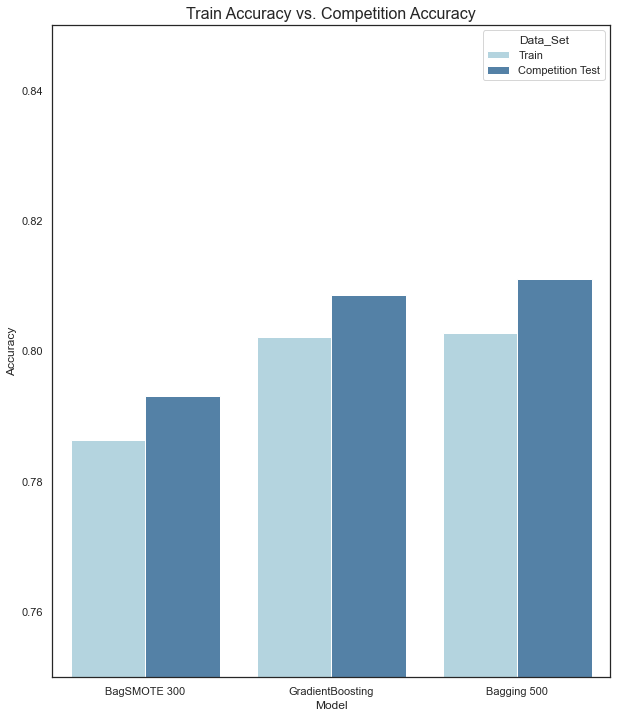

In [210]:
sns.set(style='white')
fig, ax = plt.subplots(figsize=(10, 12))
#create grouped bar chart
sns.barplot(x='Classifier', y='Accuracy', hue='Data_Set', data=df_comp,
            palette=['lightblue', 'steelblue'])

ax.set(ylim=(.75, .85))

#add overall title
plt.title('Train Accuracy vs. Competition Accuracy', fontsize=16)

#add axis titles
plt.xlabel('Model')
plt.ylabel('Accuracy')

plt.savefig('Accuracy', bbox_inches='tight');


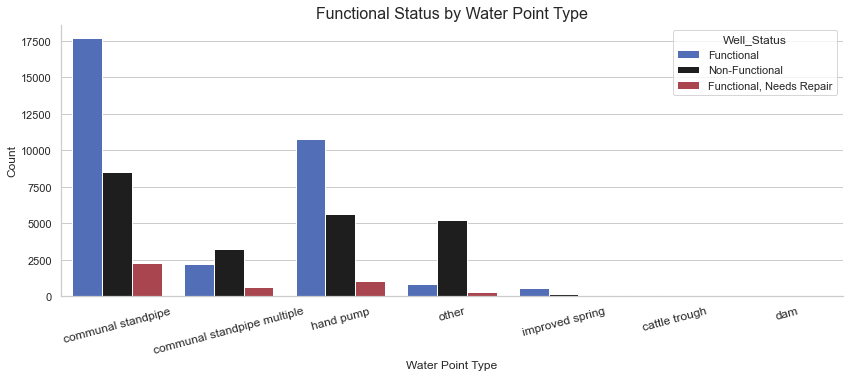

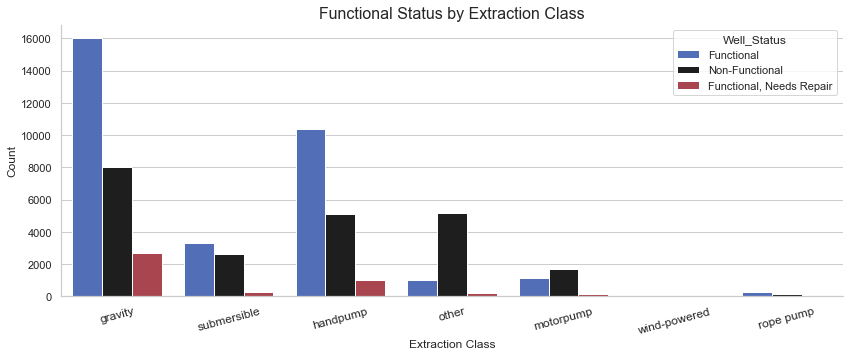

In [252]:
sns.set(style='whitegrid')
fig, ax = plt.subplots(figsize=(14, 5))
#create grouped bar chart
sns.countplot( x='extraction_type_class',  hue='status_group', data=df_train, palette="icefire" )
        

#add overall title
plt.title('Functional Status by Extraction Class', fontsize=16)

#add axis titles
plt.xlabel('Extraction Class')
plt.ylabel('Count')
plt.xticks(rotation=15, size=12)

plt.legend(loc='upper right', title = "Well_Status", labels = ['Functional', "Non-Functional", "Functional, Needs Repair"])

sns.despine()

plt.savefig('Extraction Type Class', bbox_inches='tight');

Feature Importance Graph pulled from another collaborator's work.

In [207]:
df_PI = pd.read_csv('../data/PI.csv')
df_PI


,Features,Importance
0,Longitude,0.186
1,Water Quantity,0.176
2,Latitude,0.145
3,Water Point Type,0.141
4,Total Static Head,0.105
5,Construction Year,0.086
6,Extraction Type,0.055
7,Population,0.048
8,Management,0.044
9,GPS Height,0.044


C:\Users\01aut\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



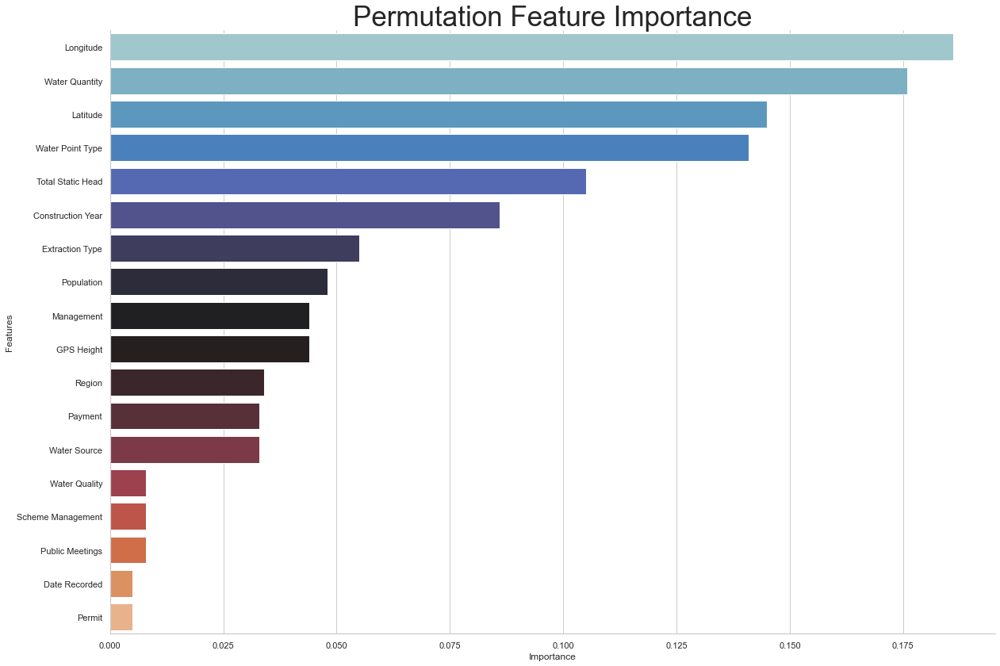

In [208]:
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(20, 14))

ax = sns.barplot(df_PI['Importance'], df_PI['Features'], palette="icefire")

sns.despine()

ax.set_title('Permutation Feature Importance', fontsize=35)
# ax.set_xlabel('Model Number', fontsize=35)

plt.savefig('Permutation Feature Importance', bbox_inches='tight');

We analysized this and decided to plot graphs for water point type and extraction type to get a better look.

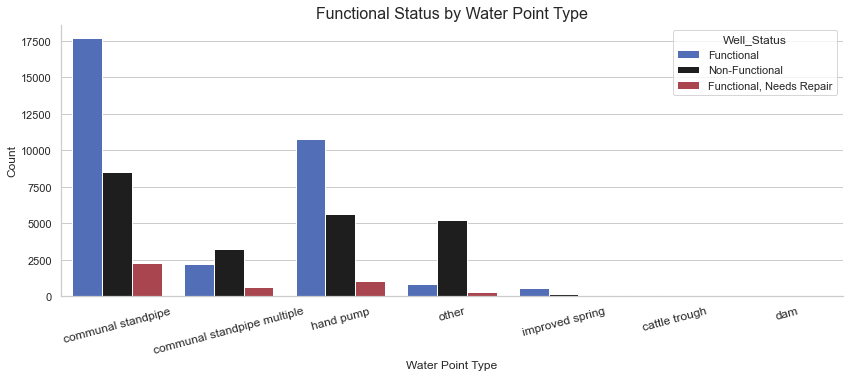

In [259]:
sns.set(style='whitegrid')
fig, ax = plt.subplots(figsize=(14, 5))
#create grouped bar chart
sns.countplot( x='waterpoint_type',  hue='status_group', data=df_train, palette="icefire")
        

#add overall title
plt.title('Functional Status by Water Point Type', fontsize=16)

#add axis titles
plt.xlabel('Water Point Type')
plt.ylabel('Count')
plt.xticks(rotation=15, size=12)

plt.legend(loc='upper right', title = "Well_Status", labels = ['Functional', "Non-Functional", "Functional, Needs Repair"])

sns.despine()

#plt.savefig('WaterPoint Type', bbox_inches='tight');

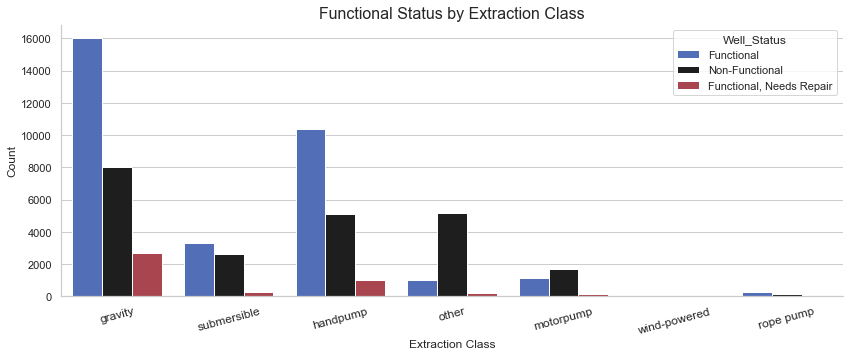

In [260]:

sns.set(style='whitegrid')
fig, ax = plt.subplots(figsize=(14, 5))
#create grouped bar chart
sns.countplot( x='extraction_type_class',  hue='status_group', data=df_train, palette="icefire" )
        

#add overall title
plt.title('Functional Status by Extraction Class', fontsize=16)

#add axis titles
plt.xlabel('Extraction Class')
plt.ylabel('Count')
plt.xticks(rotation=15, size=12)

plt.legend(loc='upper right', title = "Well_Status", labels = ['Functional', "Non-Functional", "Functional, Needs Repair"])

sns.despine()

#plt.savefig('Extraction Type Class', bbox_inches='tight');